In [1]:
%%capture
import pickle
import numpy as np
import math
import scipy as sp
from EM import EM

### Hyperparameters

In [25]:
bin_size = 60 * 12
num_obs_cutoff = 5

In [26]:
data = pickle.load(open('../Data/unimputed_inr_patient_data.pkl', 'rb'), encoding='latin1')

### Preprocessing
* Cut each time series (obs and treatmens) start at the first observatio
* Bin time series (try one hour first but keep it flexible so we can adjust the bin if needed)
* Check if there are multiple treatments of the same type in each bin after binning, decide using integer and binary value to represent treatments
* Convert treatment, static conditions (chronic and age) into matrix form

In [27]:
# select the data based on a cutoff on the number of observations, default to 5
def cutoff_num_obs(data, cutoff):
    new_data = []
    for d in data:
        if d['obs_times'].shape[0] >= cutoff:
            new_data.append(d)
    return new_data

data = cutoff_num_obs(data, num_obs_cutoff)
len(data)

2524

In [28]:
def get_new_time(old_time, starting_time):
    new_time = np.subtract(old_time, starting_time)
    # there might be some treatments before the first observation, discard them
    new_time = np.delete(new_time, np.where(new_time < 0))
    return new_time

# align the time series so that t=0 is where the observation starts
new_data = np.copy(data)
for i, d in enumerate(data):
    starting_time = d['obs_times'][0]
    names = ['obs', 'anticoagulant', 'aspirin', 'nsaid']
    for name in names:
        new_data[i][name + '_times'] = get_new_time(d[name + '_times'], starting_time)
    for j, t in enumerate(d['transfusion_times']):
        if t.shape[0] > 0:
            new_data[i]['transfusion_times'][j] = get_new_time(t, starting_time)
    new_data[i]['transfusion_times'] = np.concatenate(new_data[i]['transfusion_times'])
    new_data[i]['event_time'] = d['event_time'] - starting_time
data = new_data

In [29]:
def get_bins(bin_size):
    max_obs_times = -np.inf
    for d in data:
        if d['obs_times'][-1] > max_obs_times:
            max_obs_times = d['obs_times'][-1]
    num_bins = math.ceil(max_obs_times / bin_size)
    bins = np.linspace(0, max_obs_times, num_bins)
    return bins

# data is the original data, y_times is obs_times after being aligned at the beginning
# if multiple values are in the same bin, take the average
def binning_y(data, bins):
    y_mtx = np.zeros((len(data), len(bins)-1))
    for i, d in enumerate(data):
        y_binned = np.full(len(bins)-1, np.nan)
        binned_index = np.digitize(d['obs_times'], bins)
        for j in range(1, y_binned.shape[0]):
            index = np.where(binned_index==j)[0]
            if index.shape[0] > 0:
                values = d['obs_y'][index]
                y_binned[j-1] = np.mean(values)
        y_mtx[i, :] = y_binned
    return y_mtx

In [30]:
def binning_X(data, bins):
    X_mtx = np.zeros((len(data), len(bins)-1, 4))
    names = ['nsaid', 'transfusion', 'anticoagulant', 'aspirin']
    for i, d in enumerate(data):
        for k, name in enumerate(names):
            x_binned = np.zeros(len(bins)-1)
            binned_index = np.digitize(d[name + '_times'], bins)
            for j in range(1, x_binned.shape[0]):
                count = np.where(binned_index==j)[0].shape[0]
                x_binned[j-1] = count
            X_mtx[i, :, k] = x_binned
    return X_mtx

In [31]:
bins = get_bins(bin_size)

In [32]:
y = binning_y(data, bins)

In [33]:
last_obs = np.zeros(y.shape[0], dtype=int)
for i in range(y.shape[0]):
    last_obs[i] = np.where(np.invert(np.isnan(y[i, :])))[0][-1] + 1

train_pct = .7
last_train_obs = np.zeros(y.shape[0], dtype=int)
for i in range(y.shape[0]):
    non_nan_idx = np.where(np.invert(np.isnan(y[i, :])))[0]
    last_train_obs[i] = non_nan_idx[int(non_nan_idx.shape[0] * train_pct) - 1] + 1

In [34]:
y_cuttail = {}
for i in range(y.shape[0]):
    y_cuttail[i] = y[i, 0:last_obs[i]]

In [35]:
missing_pct = 0
for _, obs in y_cuttail.items():
    pct = np.where(np.isnan(obs))[0].shape[0] / obs.shape[0]
    missing_pct += pct
missing_pct /= len(y_cuttail)
missing_pct * 100

44.70737226091535

In [36]:
X = binning_X(data, bins)

In [37]:
def get_c(data):
    c_mtx = np.zeros((len(data), 3))
    for i, d in enumerate(data):
        c = np.concatenate([d['chronic'], d['demographic']], axis=0)
        c_mtx[i, :] = c
    return c_mtx

In [38]:
c = get_c(data)

In [39]:
print('percentage of patients in the data with liver disease: {}'.format\
      (np.nonzero(c[:, 0])[0].shape[0] / c.shape[0] * 100))
print('percentage of patients in the data with sickle cell: {}'.format\
      (np.nonzero(c[:, 1])[0].shape[0] / c.shape[0] * 100))

percentage of patients in the data with liver disease: 8.161648177496037
percentage of patients in the data with sickle cell: 0.554675118858954


### Problems
* Current setting: 10 observations is the cutoff, bin size is 18 hrs --> average missing percentage = 27%
* The directions of the coefficients for chronic and diseases are wrong (should be positive but are negative), because population imbalance?
* Two of the treatment coefficients also wrong
* Sigma_2 is slightly larger than sigma_1, while it should be order of magnitude smaller 
* When decrease cutoff from 10 to 9 (increase population size from ~600 to ~1000), linear least square broke with message incompatible dimensions, unable to test whether increase training size gives better performance

In [40]:
em = EM(y, X, c, 2, 0, .7)

In [41]:
%%time
em.run_EM(500)

57 iterations before convergence
CPU times: user 1min, sys: 2.03 s, total: 1min 2s
Wall time: 27.9 s


In [42]:
em.A

array([[ 0.03513875, -0.24447876, -0.43910747,  0.0134353 ],
       [ 0.00071532, -0.17906307, -0.25617665,  0.05897228]])

In [43]:
em.b

array([-0.54910405, -0.75972678, -0.02465095])

In [44]:
em.sigma_1

1.4911618715832613

In [45]:
em.sigma_2

1.7684879155127136

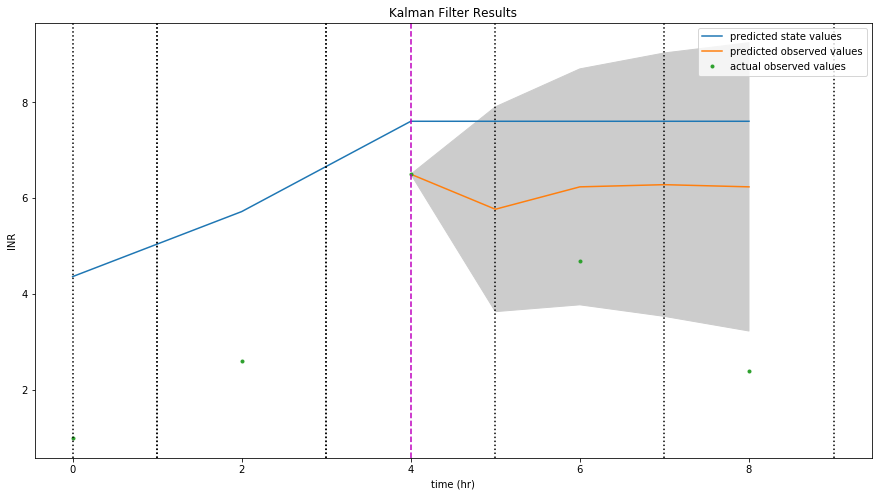

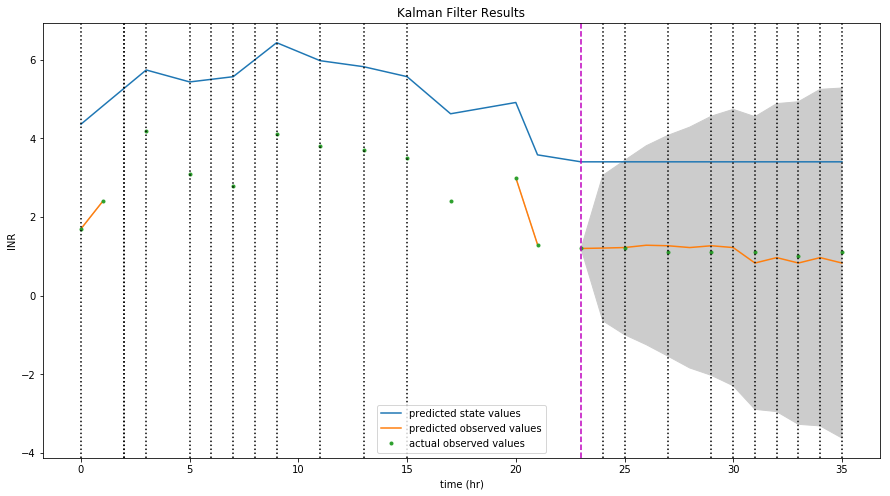

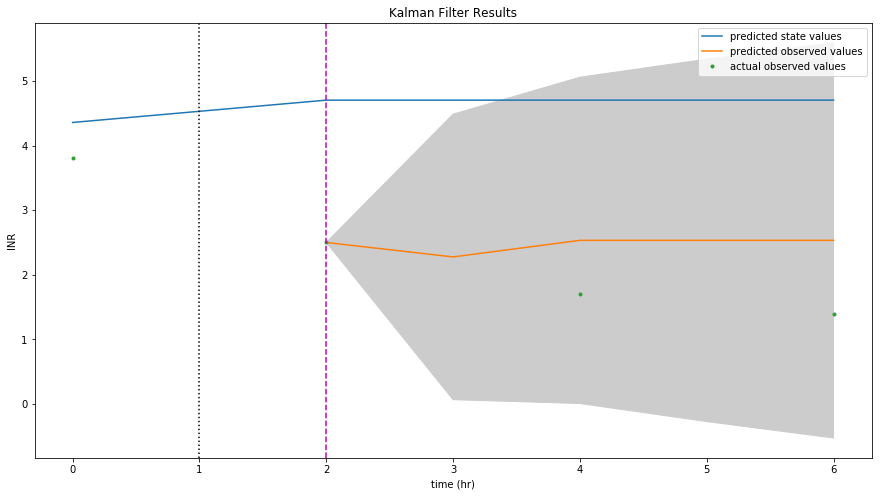

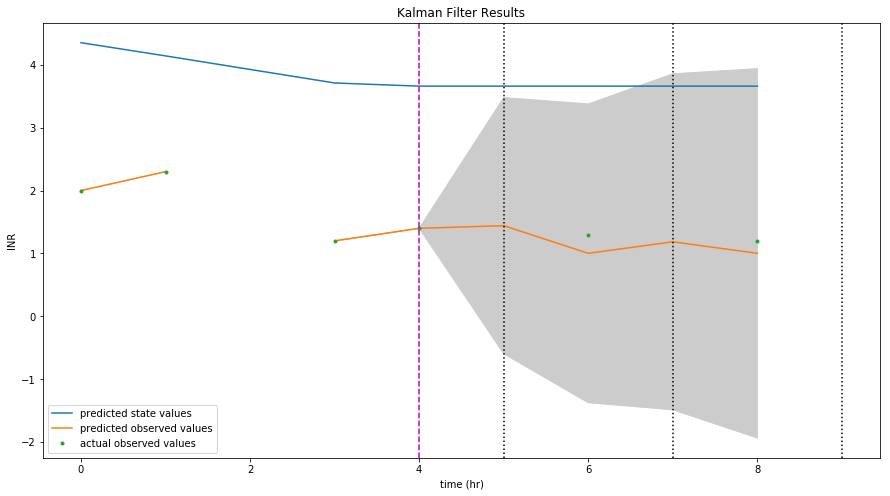

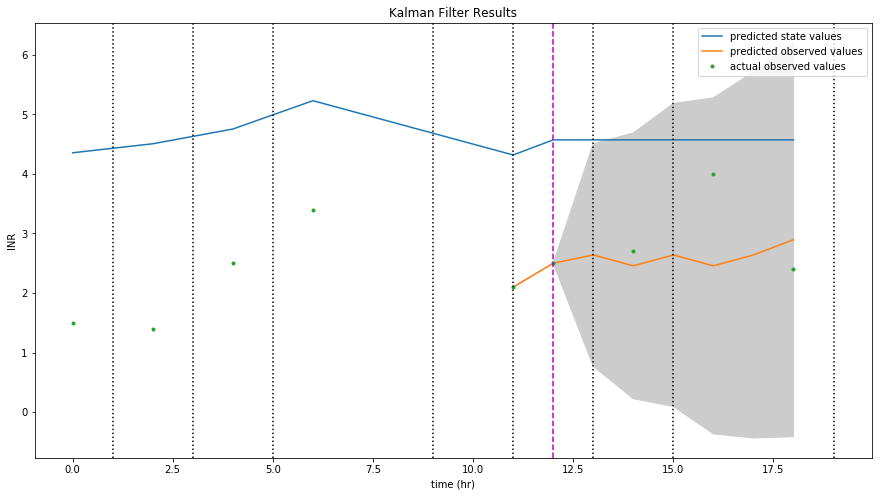

...

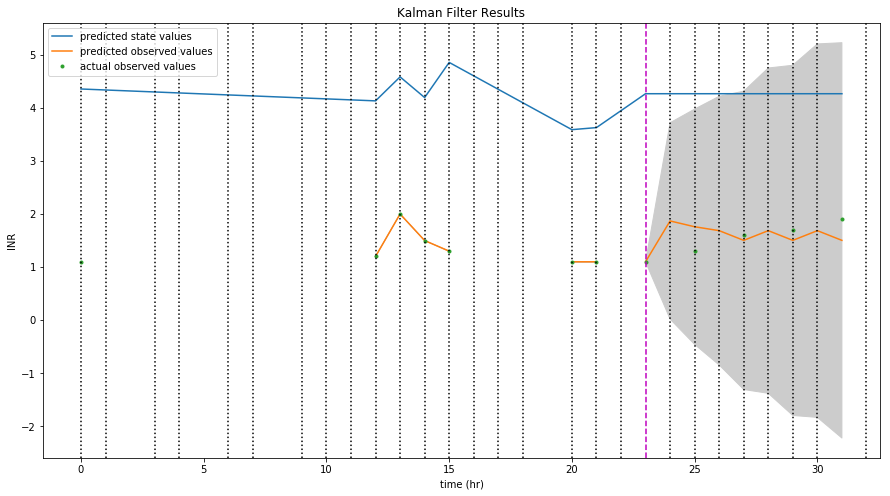

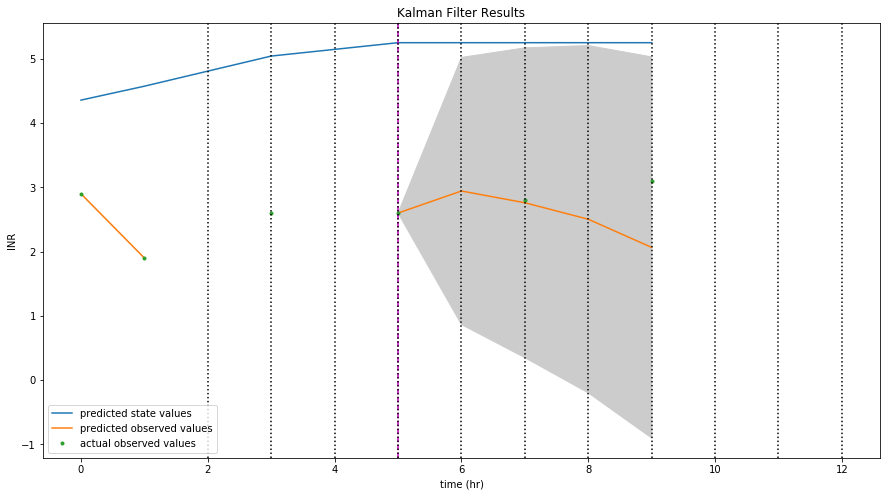

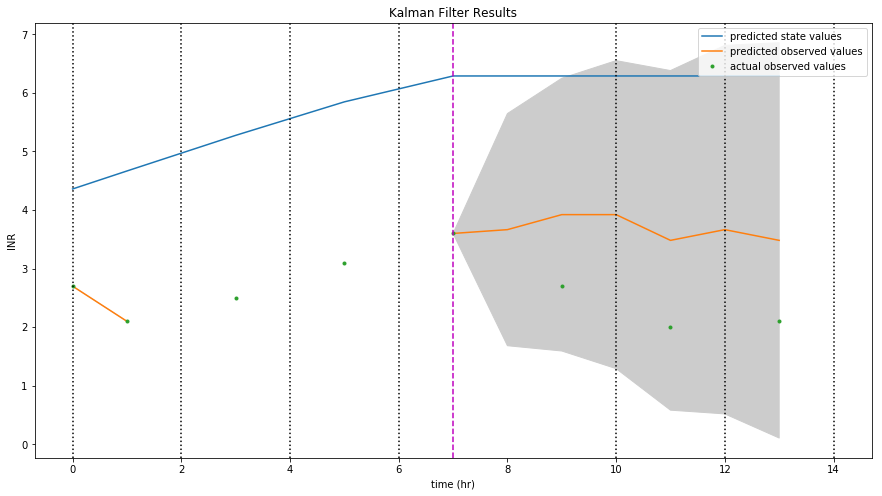

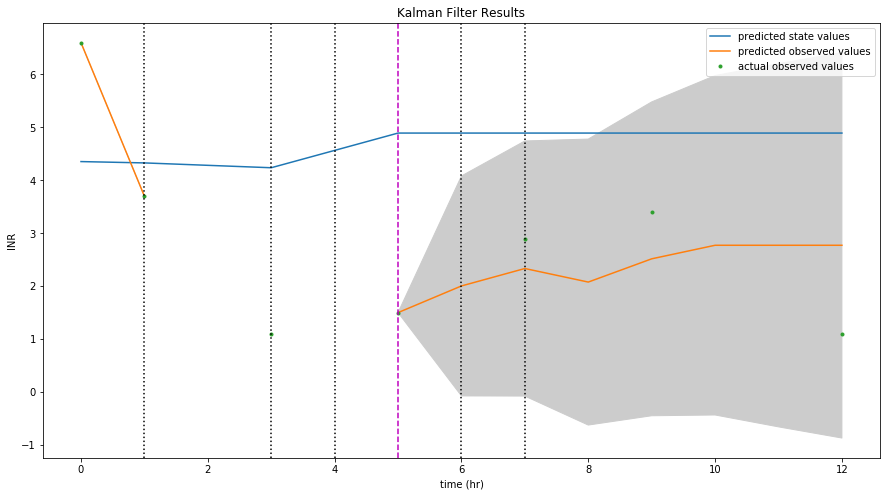

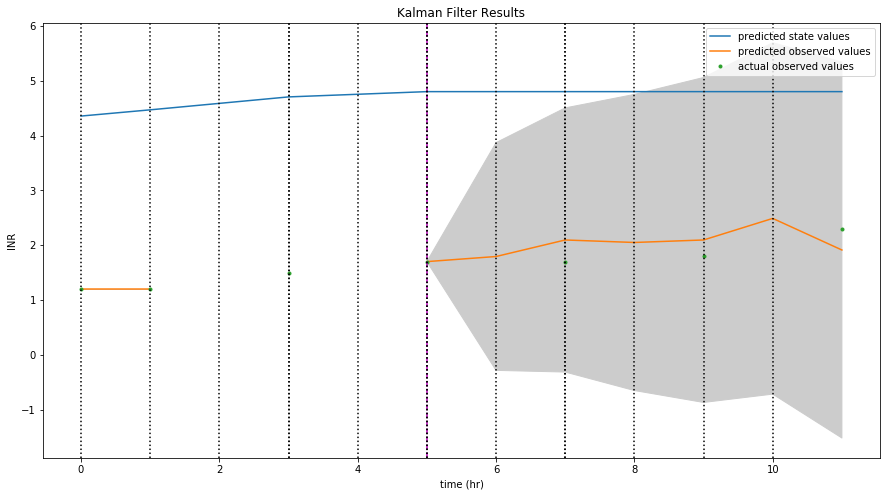

In [ ]:
for i in range(y.shape[0]):
    em.plot(i, False)

### TO DO
* Take note of the importance of different design choices on the result, provide some analysis
* Write down some analysis with different values of cutoff (tra8ining size), bin size (missingness), see if coefficient learning improves, ideally more granularity but not too much missingness 
* Put informative prior on coefficients see if improves